<a href="https://colab.research.google.com/github/nadgir-praveen/data-science-lab/blob/main/assignments/HM_M2_MP4_NB_Employee_Attrition_Prediction_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Certification Program in Computational Data Science
## A program by IISc and TalentSprint
### Mini Project Notebook: Employee Attrition Prediction

## **Note:** This notebook is part of an in-house Kaggle competition

## Problem Statement

To predict employee attrition using CatBoost and XgBoost

## Learning Objectives

At the end of the experiment, you will be able to

* explore the employee attrition dataset
* apply CatBoost and XgBoost on the dataset
* tune the model hyperparameters to improve accuracy
* evaluate the model using suitable metrics


## Introduction

Employee attrition is the gradual reduction in employee numbers. Employee attrition happens when the size of your workforce diminishes over time. This means that employees are leaving faster than they are hired. Employee attrition happens when employees retire, resign, or simply aren't replaced.
Although employee attrition can be company-wide, it may also be confined to specific parts of a business.

Employee attrition can happen for several reasons. These include unhappiness about employee benefits or the pay structure, a lack of employee development opportunities, and even poor conditions in the workplace.

To know more about the factors that lead to employee attrition, refer [here](https://www.betterup.com/blog/employee-attrition#:~:text=Employee%20attrition%20is%20the%20gradual,or%20simply%20aren't%20replaced).


**Gradient Boosted Decision Trees**

* Gradient boosted decision trees (GBDTs) are one of the most important machine learning models.

* GBDTs originate from AdaBoost, an algorithm that ensembles weak learners and uses the majority vote, weighted by their individual accuracy, to solve binary classification problems. The weak learners in this case are decision trees with a single split, called decision stumps.

* Some of the widely used gradient boosted decision trees are XgBoost, CatBoost and LightGBM.

## Dataset

The dataset used for this mini-project is [HR Employee Attrition dataset](https://data.world/aaizemberg/hr-employee-attrition). This dataset is synthetically created by IBM data scientists. There are 35 features and 1470 records.

There are numerical features such as:

* Age
* DistanceFromHome
* EmployeeNumber
* PerformanceRating

There are several categorical features such as:
* JobRole
* EducationField
* Department
* BusinessTravel

Dependent or target feature is 'attrition' which has values as Yes/No.

### **Kaggle Competition**

Please refer to the link for viewing the
[Kaggle Competition Document](https://drive.google.com/file/d/1YNYJR8iXuvmEgAZQYNmBpGQbc66Lkwnq/view?usp=sharing) and join the Kaggle Competition using the hyperlink given in this document under '*Kaggle* Competition site'.

## Grading = 10 Points

In [ ]:
#@title Download the data
!wget -qq https://cdn.iisc.talentsprint.com/CDS/MiniProjects/hr_employee_attrition_train.csv
print("Data Downloaded Successfuly!!")

Data Downloaded Successfuly!!


### Install CatBoost

In [ ]:
!pip -qq install catboost
!pip install --quiet optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.1 MB/s eta 0:00:00


### Import Required Packages

In [ ]:
#For Kaggle

#!pip install kaggle

#from google.colab import drive
#import os

#drive.mount('/content/drive')
#os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/"

MessageError: Error: credential propagation was unsuccessful

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
import xgboost as xgb
from catboost import CatBoostClassifier, metrics
import warnings
import optuna
from sklearn.model_selection import cross_val_score
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 100)
%matplotlib inline

## Load the Dataset

**Exercise 1: Read the dataset [0.5 Mark]**

**Hint:** pd.read_csv()

In [ ]:
# read the dataset
# YOUR CODE HERE
emp_attr_df = pd.read_csv("/content/hr_employee_attrition_train.csv")

In [ ]:
# Check the shape of dataframe.
# YOUR CODE HERE
emp_attr_df.shape

(1170, 35)

In [ ]:
emp_attr_df.head()

,age,businesstravel,dailyrate,department,distancefromhome,education,educationfield,employeecount,employeenumber,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,over18,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager,attrition
0,45,Travel_Rarely,556,Research & Development,25,2,Life Sciences,1,1888,2,Female,93,2,2,Manufacturing Director,4,Married,5906,23888,0,Y,No,13,3,4,80,2,10,2,2,9,8,3,8,No
1,34,Travel_Rarely,970,Research & Development,8,2,Medical,1,757,2,Female,96,3,2,Healthcare Representative,3,Single,6142,7360,3,Y,No,11,3,4,80,0,10,2,3,5,1,4,3,No
2,39,Travel_Rarely,360,Research & Development,23,3,Medical,1,1310,3,Male,93,3,1,Research Scientist,1,Single,3904,22154,0,Y,No,13,3,1,80,0,6,2,3,5,2,0,3,Yes
3,26,Travel_Rarely,933,Sales,1,3,Life Sciences,1,476,3,Male,57,3,2,Sales Executive,3,Married,5296,20156,1,Y,No,17,3,2,80,1,8,3,3,8,7,7,7,No
4,40,Travel_Rarely,329,Research & Development,1,4,Life Sciences,1,1361,2,Male,88,3,1,Laboratory Technician,2,Married,2387,6762,3,Y,No,22,4,3,80,1,7,3,3,4,2,0,3,No


In [ ]:
emp_attr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1170 entries, 0 to 1169
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   age                       1170 non-null   int64 
 1   businesstravel            1170 non-null   object
 2   dailyrate                 1170 non-null   int64 
 3   department                1170 non-null   object
 4   distancefromhome          1170 non-null   int64 
 5   education                 1170 non-null   int64 
 6   educationfield            1170 non-null   object
 7   employeecount             1170 non-null   int64 
 8   employeenumber            1170 non-null   int64 
 9   environmentsatisfaction   1170 non-null   int64 
 10  gender                    1170 non-null   object
 11  hourlyrate                1170 non-null   int64 
 12  jobinvolvement            1170 non-null   int64 
 13  joblevel                  1170 non-null   int64 
 14  jobrole                 

There can be more than one file to read as this is introduced as a competition, dataset has one file for training the model. Their can be other files as one containing the test features and the other can be the true labels.

## Data Exploration

- Check for missing values
- Check for consistent data type across a feature
- Check for outliers or inconsistencies in data columns
- Check for correlated features
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships? Making correlation heatmaps makes it easy to identify possible collinearity

**Exercise 2: Create a `List` of numerical and categorical columns. Display a statistical description of the dataset. Remove missing values (if any) [0.5 Mark]**

**Hint:** Use `for` to iterate through each column.

In [ ]:
# YOUR CODE HERE
cat_columns = emp_attr_df.columns[emp_attr_df.dtypes == 'object']
numeric_columns = emp_attr_df.columns[emp_attr_df.dtypes != 'object']

print(f'Categorical columns {cat_columns}')
print(f'Numeric columns {numeric_columns}')


Categorical columns Index(['businesstravel', 'department', 'educationfield', 'gender', 'jobrole',
       'maritalstatus', 'over18', 'overtime', 'attrition'],
      dtype='object')
Numeric columns Index(['age', 'dailyrate', 'distancefromhome', 'education', 'employeecount',
       'employeenumber', 'environmentsatisfaction', 'hourlyrate',
       'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome',
       'monthlyrate', 'numcompaniesworked', 'percentsalaryhike',
       'performancerating', 'relationshipsatisfaction', 'standardhours',
       'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear',
       'worklifebalance', 'yearsatcompany', 'yearsincurrentrole',
       'yearssincelastpromotion', 'yearswithcurrmanager'],
      dtype='object')


In [ ]:
emp_attr_df.drop(columns=['employeecount'], inplace=True) #as only value is 1
emp_attr_df.drop(columns=['employeenumber'], inplace=True) #as its irrelavant to us
emp_attr_df.drop(columns=['standardhours'], inplace=True) #as only value is 80
emp_attr_df.drop(columns=['over18'], inplace=True) #as only value is Y


First, we want to get a sense of our data:
- What features have the most divergent distributions based on target class
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships, making correlation heatmaps makes it easy to identify possible colinearity

### Check for outliers

**Exercise 3: Create a box plot to check for outliers [0.5 Mark]**

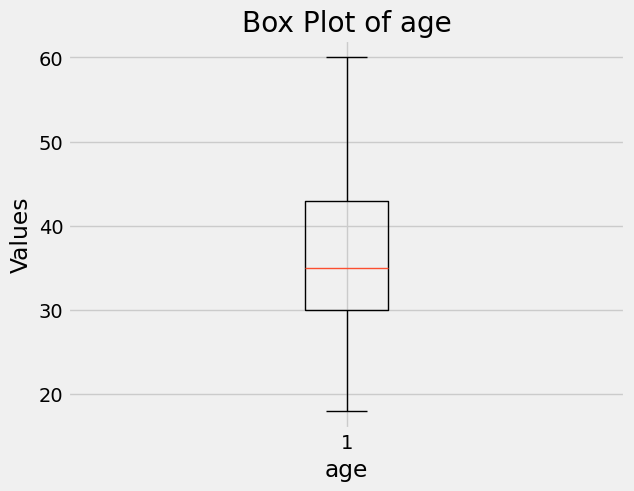

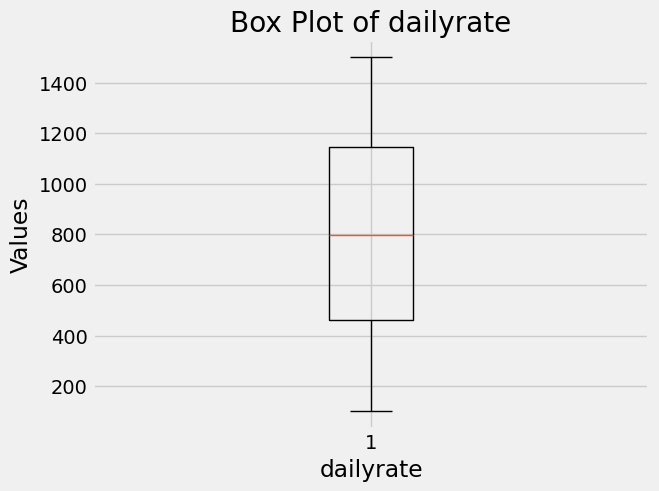

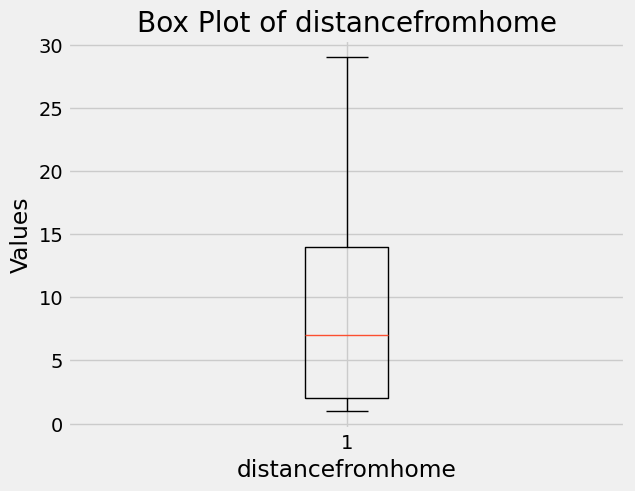

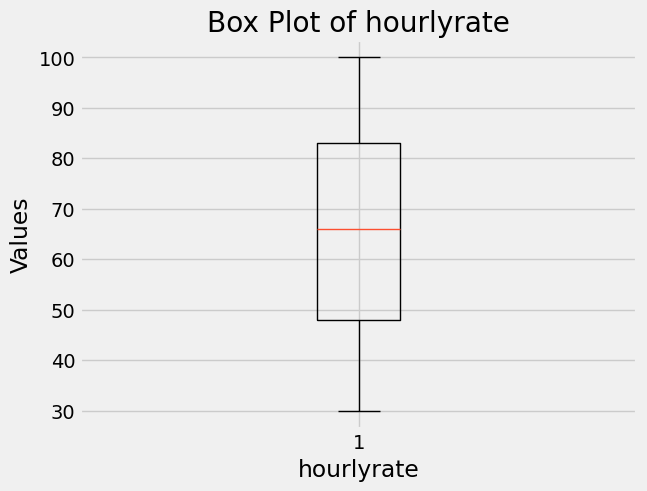

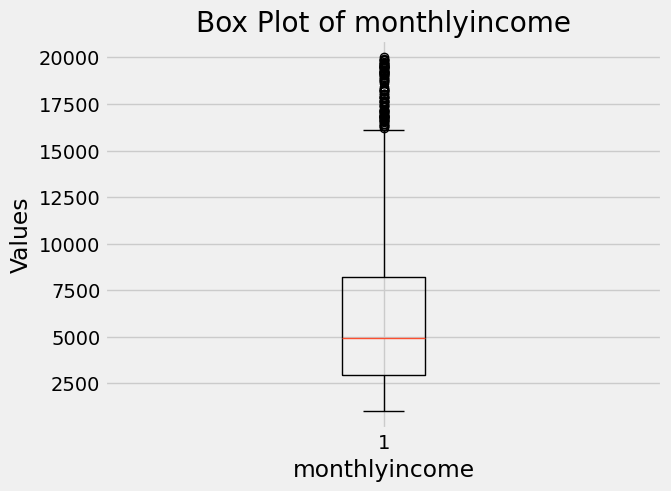

...

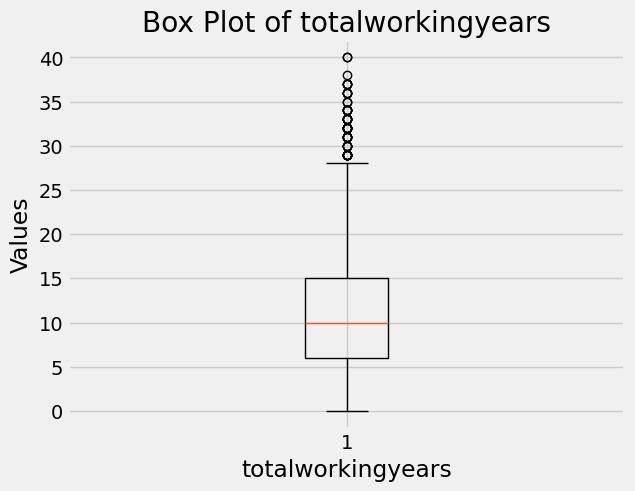

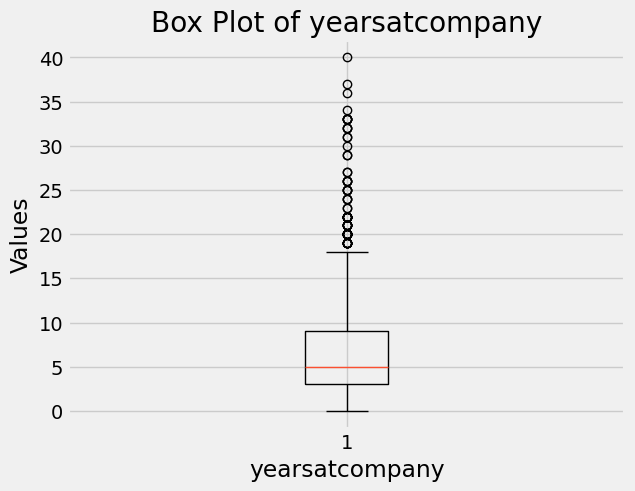

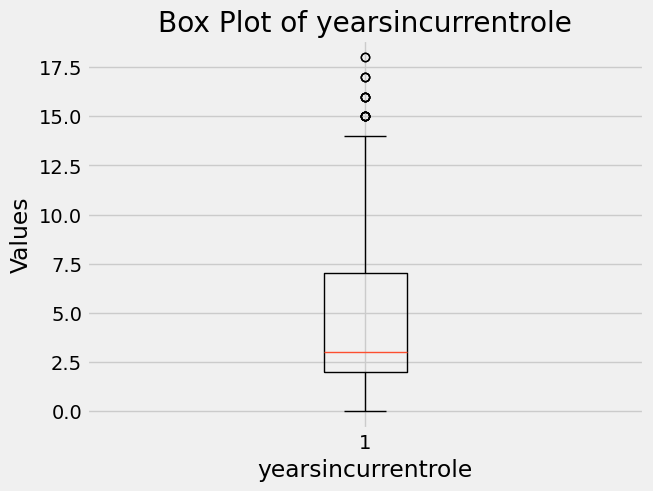

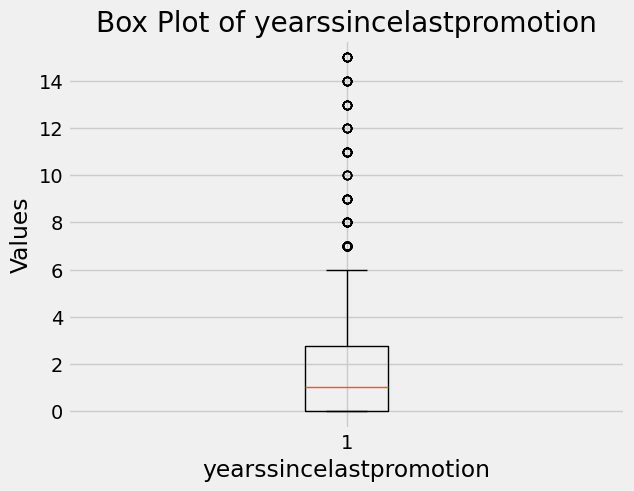

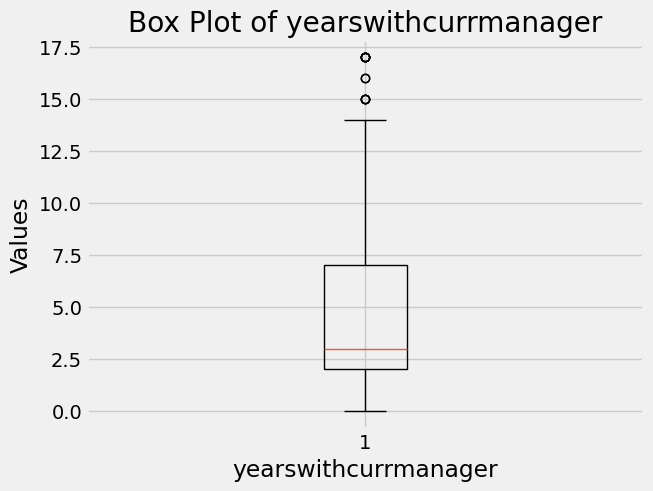

In [ ]:
# Check for outliers
# YOUR CODE HERE

for column in emp_attr_df.columns[emp_attr_df.dtypes != 'object']:
  if emp_attr_df[column].unique().size > 7:
    plt.boxplot(emp_attr_df[column])
    plt.xlabel(column)
    plt.ylabel('Values')
    plt.title(f'Box Plot of {column}')
    plt.show()

### Handling outliers

**Exercise 4: Use lower bound as 25% and upper bound as 75% to handle the outliers [0.5 Mark]**

In [ ]:
cols_with_outliers = ['yearssincelastpromotion','monthlyincome', 'numcompaniesworked', 'totalworkingyears', 'yearsatcompany', 'yearsincurrentrole', 'yearswithcurrmanager']

threshold = 1.5

for col in cols_with_outliers:
  Q1 = emp_attr_df[col].quantile(0.25)
  Q3 = emp_attr_df[col].quantile(0.75)

  IQR = Q3 - Q1

  lower_outliers = (emp_attr_df[col] < (Q1 - threshold * IQR))
  upper_outliers = (emp_attr_df[col] > (Q3 + threshold * IQR))

  print(f'Column {col} : lower bound outliers {lower_outliers.sum()} - upper bound outliers {upper_outliers.sum()} -- 25% value {Q1} -- 75% value {Q3}')

  emp_attr_df.loc[lower_outliers, col] = Q1
  emp_attr_df.loc[upper_outliers, col] = Q3

Column yearssincelastpromotion : lower bound outliers 0 - upper bound outliers 142 -- 25% value 0.0 -- 75% value 2.75
Column monthlyincome : lower bound outliers 0 - upper bound outliers 94 -- 25% value 2914.75 -- 75% value 8215.25
Column numcompaniesworked : lower bound outliers 0 - upper bound outliers 45 -- 25% value 1.0 -- 75% value 4.0
Column totalworkingyears : lower bound outliers 0 - upper bound outliers 55 -- 25% value 6.0 -- 75% value 15.0
Column yearsatcompany : lower bound outliers 0 - upper bound outliers 83 -- 25% value 3.0 -- 75% value 9.0
Column yearsincurrentrole : lower bound outliers 0 - upper bound outliers 17 -- 25% value 2.0 -- 75% value 7.0
Column yearswithcurrmanager : lower bound outliers 0 - upper bound outliers 13 -- 25% value 2.0 -- 75% value 7.0


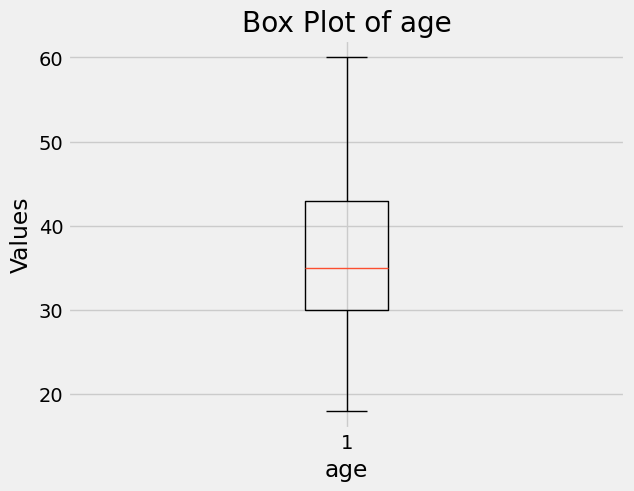

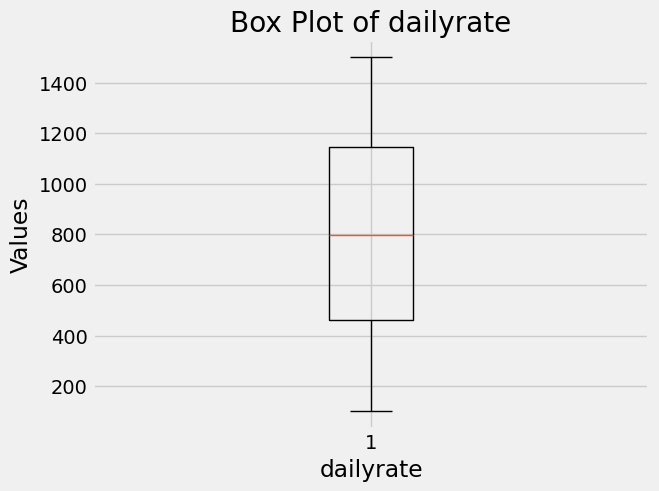

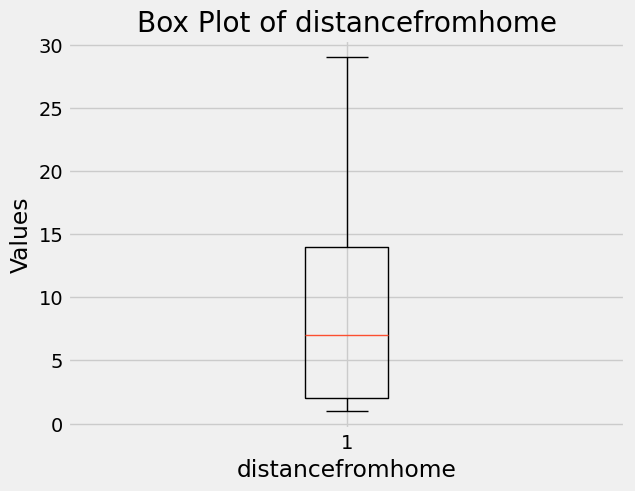

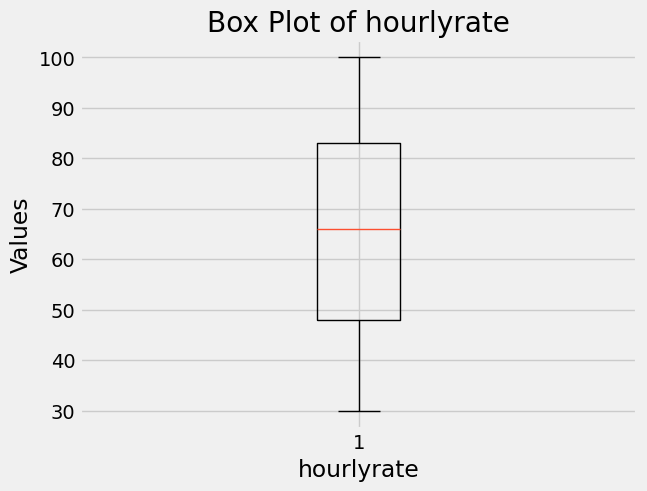

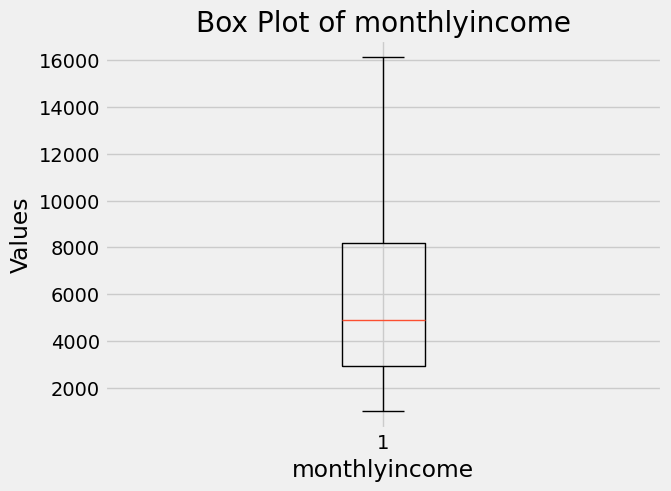

...

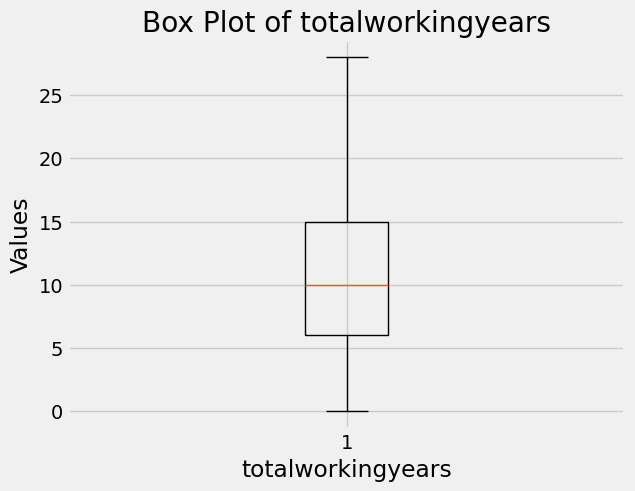

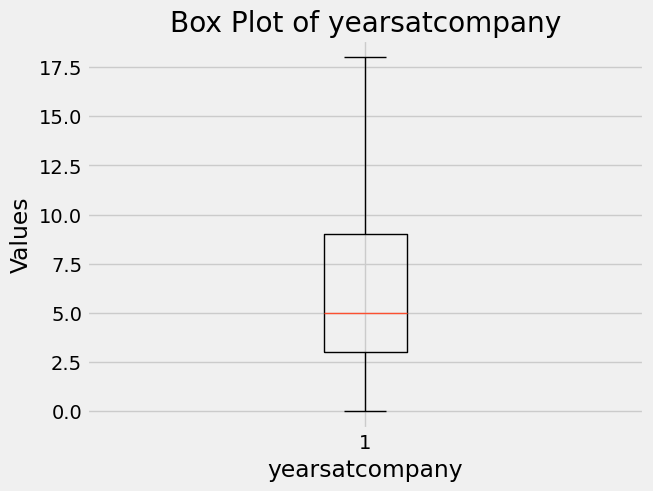

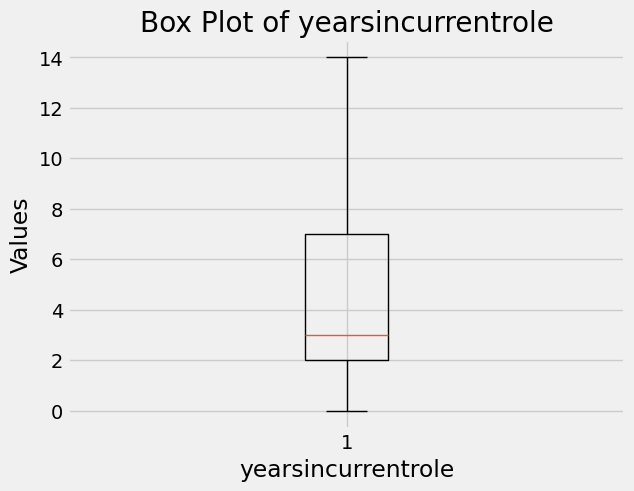

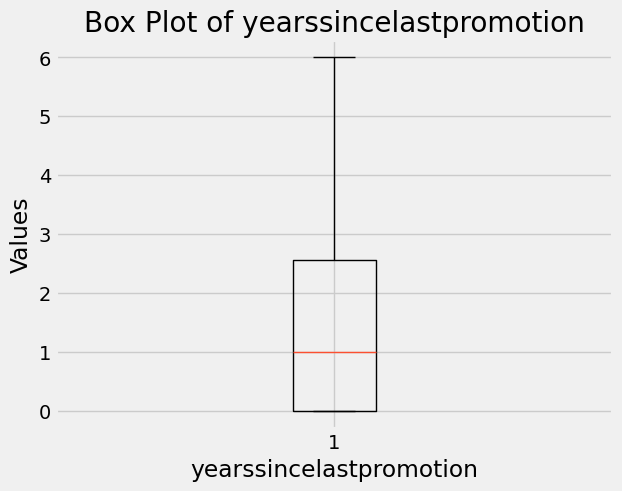

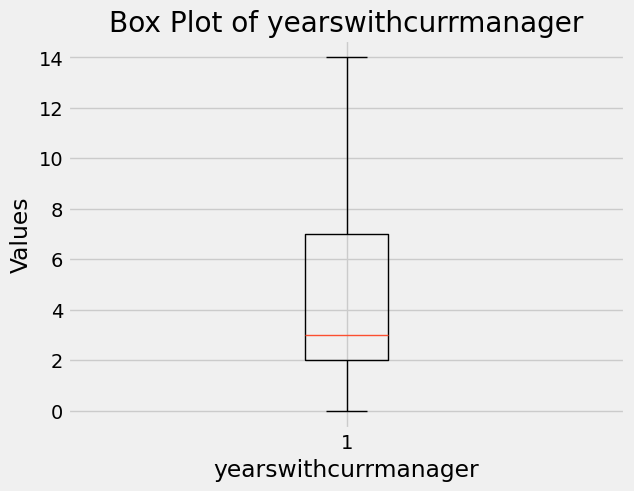

In [ ]:
# Recheck for outliers
for column in emp_attr_df.columns[emp_attr_df.dtypes != 'object']:
  if emp_attr_df[column].unique().size > 7:
    plt.boxplot(emp_attr_df[column])
    plt.xlabel(column)
    plt.ylabel('Values')
    plt.title(f'Box Plot of {column}')
    plt.show()

### Target label imbalance

**Exercise 5: Check if there is an imbalance in target label [0.5 Mark]**

**Hint:** Use value_counts()

In [ ]:
# Count of unique values in Attrition column
# YOUR CODE HERE
#emp_attr_df.isnull().sum()

attrition_proportion = emp_attr_df['attrition'].value_counts(normalize=True)
print(attrition_proportion)

No     0.838462
Yes    0.161538
Name: attrition, dtype: float64


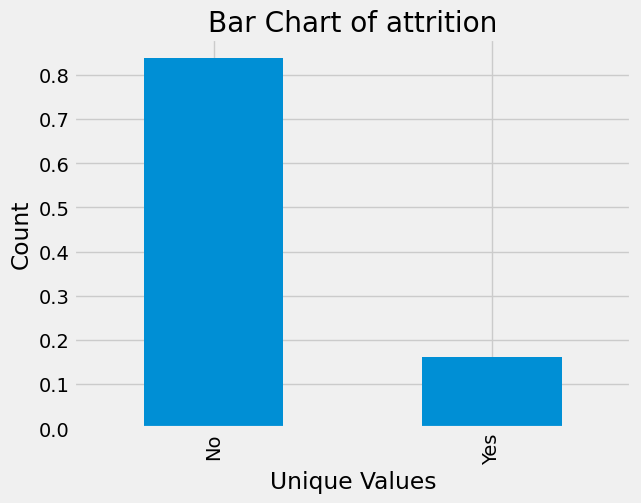

In [ ]:
# Plot barplot to visualize balance/imbalance
# YOUR CODE HERE
attrition_proportion.plot(kind='bar')
plt.title('Bar Chart of attrition')
plt.xlabel('Unique Values')
plt.ylabel('Count')

# Show the plot
plt.show()

If there is any imbalance in the dataset then a few techniques can be utilised (optional):
1. SMOTE
2. Cross Validation
3. Regularizing the model's parameters

###Plot pairplot

**Exercise 6: Visualize the relationships between the predictor variables and the target variable using a pairplot [0.5 Mark]**

**Hint:** Use sns.pairplot

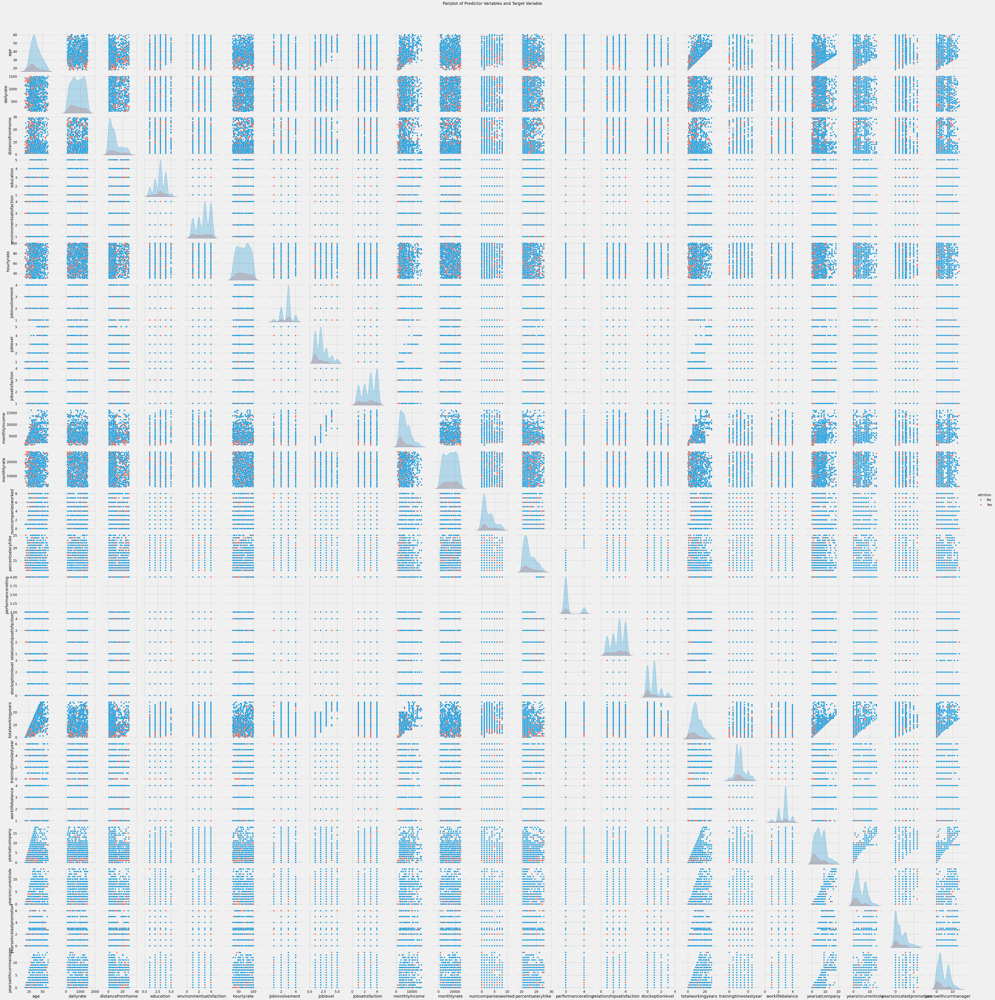

In [ ]:
# Visualize a pairplot with relevant features
columns_for_pairplot = ['age', 'dailyrate', 'distancefromhome', 'education', 'environmentsatisfaction', 'hourlyrate',
       'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome',
       'monthlyrate', 'numcompaniesworked', 'percentsalaryhike',
       'performancerating', 'relationshipsatisfaction',
       'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear',
       'worklifebalance', 'yearsatcompany', 'yearsincurrentrole',
       'yearssincelastpromotion', 'yearswithcurrmanager', 'attrition']

# Filter only a subset of columns for the pairplot (adjust as needed)
subset_df = emp_attr_df[columns_for_pairplot]

# Plot the pairplot
sns.pairplot(subset_df, hue='attrition', diag_kind='kde')
plt.suptitle('Pairplot of Predictor Variables and Target Variable', y=1.02)
plt.show()

### Explore Correlation

- Plotting the Heatmap

**Exercise 7: Visualize the correlation among IBM employee attrition numerical features using a heatmap [0.5 Mark]**

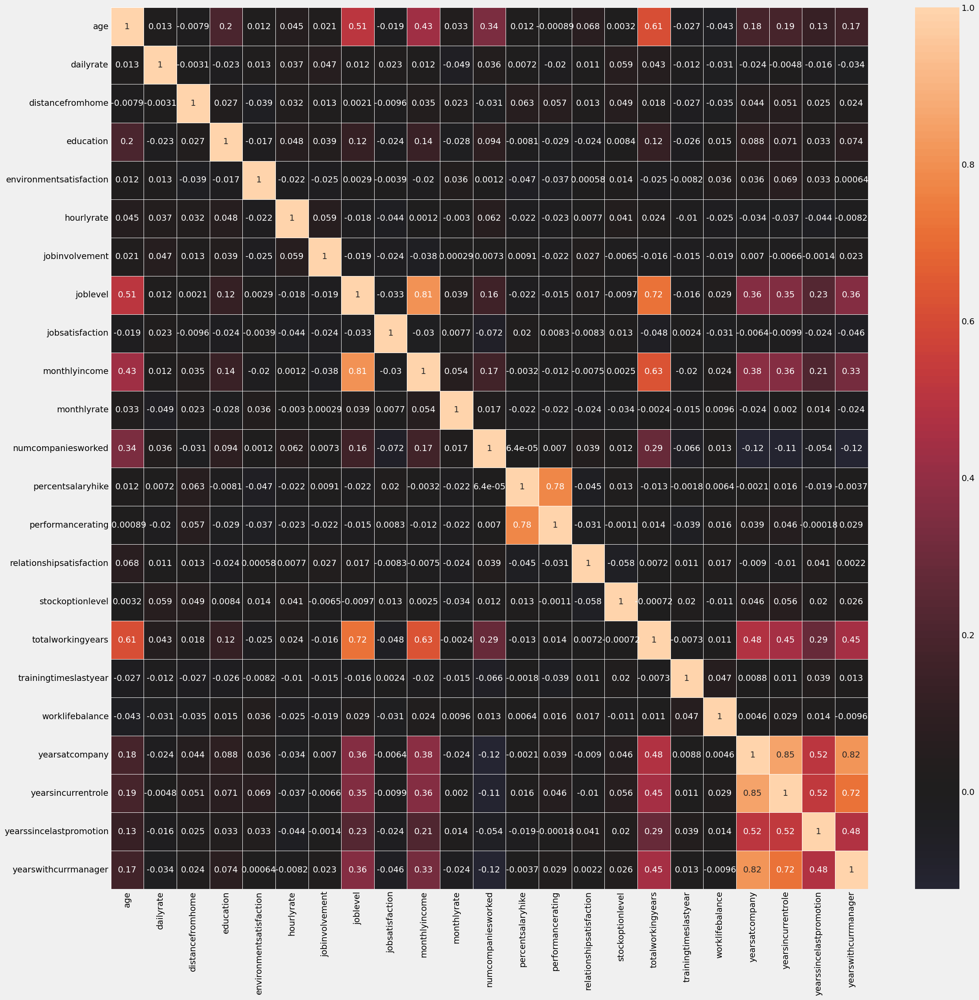

In [ ]:
# Visualize heatmap
# YOUR CODE HERE
plt.figure(figsize=(25, 25))
sns.heatmap(emp_attr_df.corr(), annot=True, linewidth=0.5, center=0)
plt.show()

Comment on the observations made with the pairplot and heatmap

### Preparing the test feature space
* Remove outliers if any
* Handle the categorical feature if required
* Other processing steps can also be followed.

In [ ]:
# YOUR CODE HERE
for col in cat_columns:
  print(f'{col} - {emp_attr_df[col].unique()}')

businesstravel - ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
department - ['Research & Development' 'Sales' 'Human Resources']
educationfield - ['Life Sciences' 'Medical' 'Technical Degree' 'Other' 'Marketing'
 'Human Resources']
gender - ['Female' 'Male']
jobrole - ['Manufacturing Director' 'Healthcare Representative' 'Research Scientist'
 'Sales Executive' 'Laboratory Technician' 'Sales Representative'
 'Human Resources' 'Manager' 'Research Director']
maritalstatus - ['Married' 'Single' 'Divorced']
over18 - ['Y']
overtime - ['No' 'Yes']
attrition - ['No' 'Yes']


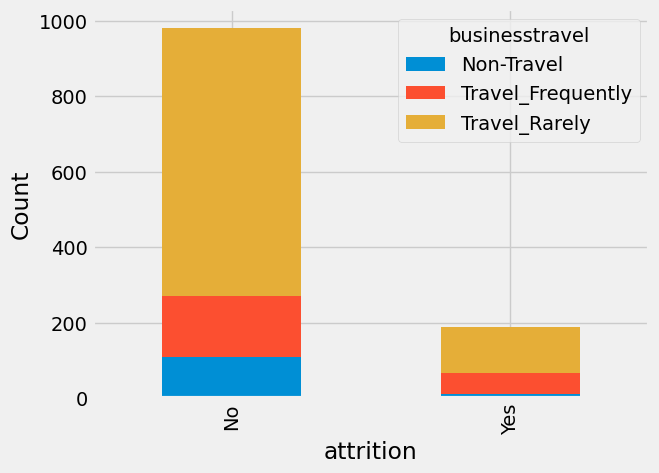

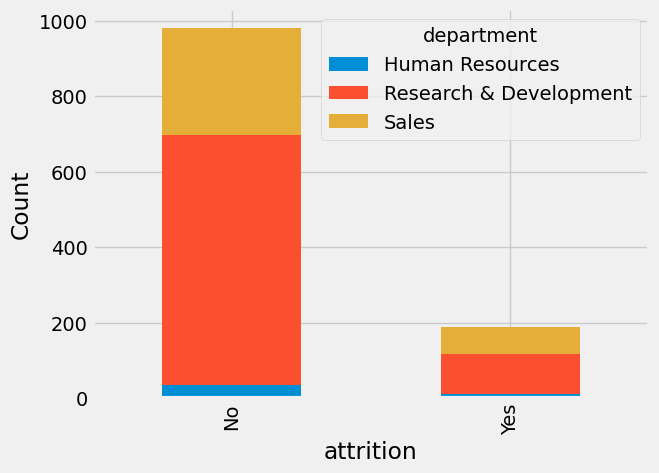

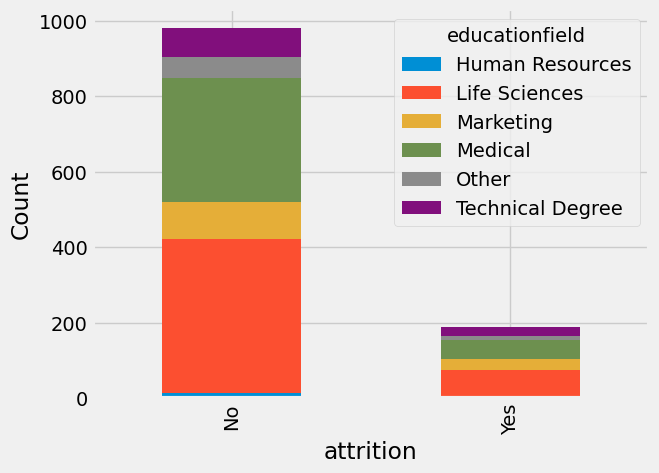

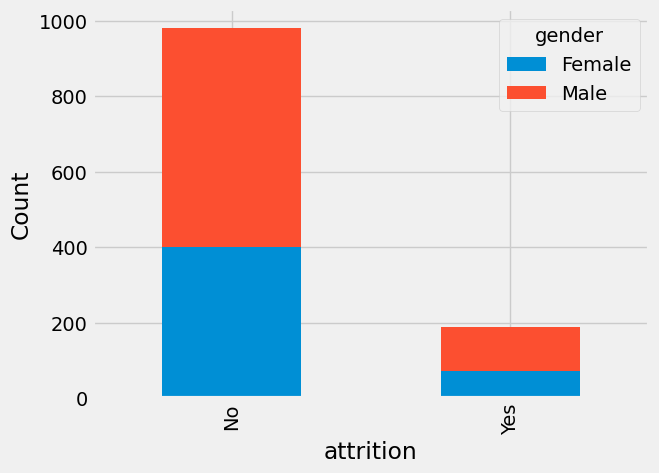

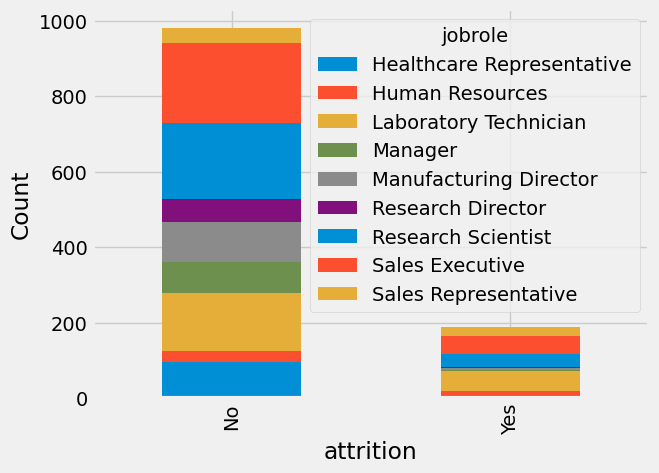

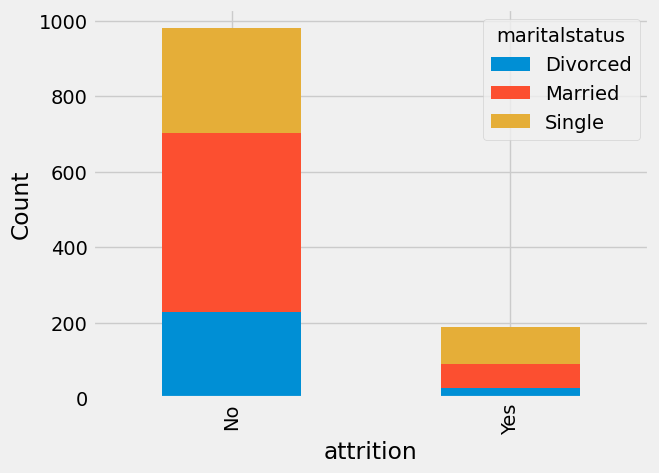

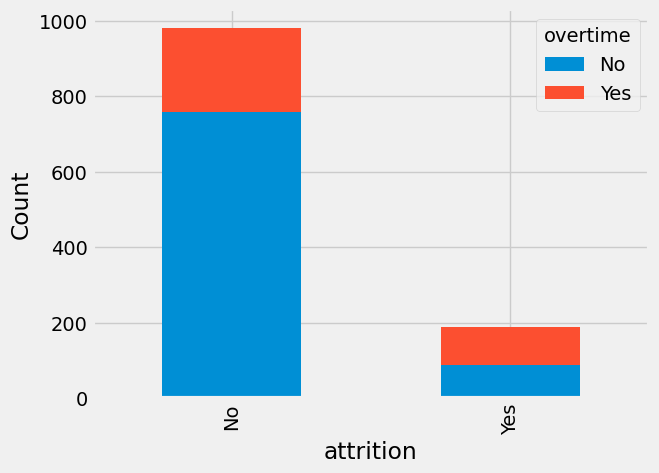

In [ ]:
target_col='attrition'

for col in ['businesstravel', 'department', 'educationfield', 'gender', 'jobrole',
       'maritalstatus', 'overtime']:
  feature_col=col

  cross_tab = pd.crosstab(emp_attr_df[target_col], emp_attr_df[feature_col])
  cross_tab.plot(kind='bar', stacked=True)
  plt.xlabel('attrition')
  plt.ylabel('Count')
  plt.show()

Optional:
Use `Hyperopt`, a hyperparameter tuning technique to identify the best set of parameters.

Refer to the Additional Notebook: CatBoost parameter tuning (CDS-B7 GDrive -> Module 2 -> Assignments -> Mar 09)

In the notebook, data processing is done separately for different models.
Considering the fact that different models may require data in different format and in turn different processes may be followed to process the data.

If the processing steps followed for the models are same, data processing can also be done once.

## Apply CatBoost

Catboost was released in 2017 by Yandex, showing, by their benchmark to be faster in prediction, better in accuracy, and easier to use for categorical data across a series of GBDT tasks. Additional capabilities of catboost include plotting feature interactions and object (row) importance.

[Here](https://catboost.ai/en/docs/) is the official documentation of CatBoost

### Data Processing for CatBoost

**Exercise 8: Data processing for CatBoost [1 Mark]**
* **Copy the dataframe that was created after removing the outliers**
* **Handle the categorical features if required**
* **Create target column and feature space**

**Hint:** Column containing the information on attrition will be the target column.

In [ ]:
# Target Column
# YOUR CODE HERE
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()

emp_attr_df['attrition_encoded'] = labelencoder.fit_transform(emp_attr_df['attrition'])

emp_attr_target=emp_attr_df[['attrition_encoded']]

In [ ]:
# Feature Space
# YOUR CODE HERE
emp_attr_features=emp_attr_df[['age', 'businesstravel', 'dailyrate', 'department', 'distancefromhome',
       'education', 'educationfield', 'environmentsatisfaction', 'gender',
       'hourlyrate', 'jobinvolvement', 'joblevel', 'jobrole',
       'jobsatisfaction', 'maritalstatus', 'monthlyincome', 'monthlyrate',
       'numcompaniesworked', 'overtime', 'percentsalaryhike',
       'performancerating', 'relationshipsatisfaction', 'stockoptionlevel',
       'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance',
       'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion',
       'yearswithcurrmanager']]

### Model Definition

**Exercise 9: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use CatBoostClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model. Refer [here](https://catboost.ai/en/docs/concepts/speed-up-training) to see some ways to speedup CatBoost training.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Split the data into train and test
x_train, x_test, y_train, y_test = train_test_split(emp_attr_features, emp_attr_target, test_size = 0.20, random_state = 2)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((936, 30), (936, 1), (234, 30), (234, 1))

In [ ]:
# Create CatBoost model
# YOUR CODE HERE
#Best score: 0.8707264957264957
#Best params: {'iterations': 639, 'depth': 4, 'learning_rate': 0.20633433646057187, 'random_strength': 0.9751916275047459}

CatBoost_clf = CatBoostClassifier(iterations=639,
                                  depth=4,
                                  learning_rate=0.20633433646057187,
                                  random_strength=0.9751916275047459,
                                  cat_features=['businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'overtime'],
                                  #loss_function='CrossEntropy'
                                  )

In [ ]:
# Model training
# YOUR CODE HERE
CatBoost_clf.fit(x_train, y_train,
                 cat_features=['businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'overtime'],
                 eval_set = (x_test, y_test),
                 verbose = False)

### Model performance

In [ ]:
# Model performance on all sets
# YOUR CODE HERE
cbr_prediction = CatBoost_clf.predict(x_test)
acc_scr_catboost = accuracy_score(y_test, cbr_prediction)

print('Accuracy Score: ', accuracy_score(y_test, cbr_prediction))

Accuracy Score:  0.8974358974358975


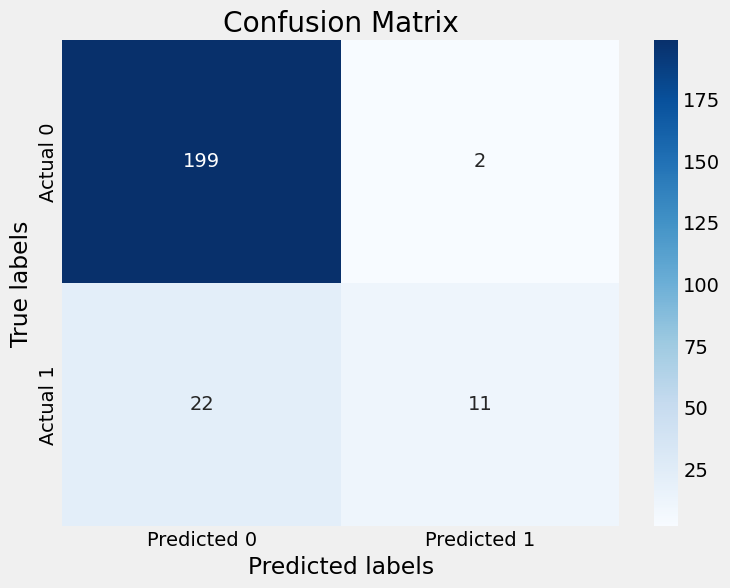

In [ ]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_test, cbr_prediction)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
#Download and preprocess Kaggle test dataset
kaggle_df = pd.read_csv('/content/hr_employee_attrition_test.csv')

kaggle_df.columns = map(str.lower, kaggle_df.columns)

kaggle_df.drop(columns=['employeecount'], inplace=True) #as only value is 1
kaggle_df.drop(columns=['employeenumber'], inplace=True) #as its irrelavant to us
kaggle_df.drop(columns=['standardhours'], inplace=True) #as only value is 80
kaggle_df.drop(columns=['over18'], inplace=True) #as only value is Y

labelencoder = LabelEncoder()

kaggle_features=kaggle_df[['age', 'businesstravel', 'dailyrate', 'department', 'distancefromhome',
       'education', 'educationfield', 'environmentsatisfaction', 'gender',
       'hourlyrate', 'jobinvolvement', 'joblevel', 'jobrole',
       'jobsatisfaction', 'maritalstatus', 'monthlyincome', 'monthlyrate',
       'numcompaniesworked', 'overtime', 'percentsalaryhike',
       'performancerating', 'relationshipsatisfaction', 'stockoptionlevel',
       'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance',
       'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion',
       'yearswithcurrmanager']]

kaggle_df.head()

,id,age,businesstravel,dailyrate,department,distancefromhome,education,educationfield,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
0,1,28,Travel_Rarely,1144,Sales,10,1,Medical,4,Male,74,3,1,Sales Representative,2,Married,1052,23384,1,No,22,4,2,0,1,5,3,1,0,0,0
1,2,32,Travel_Frequently,585,Research & Development,10,3,Life Sciences,1,Male,56,3,1,Research Scientist,3,Married,3433,17360,6,No,13,3,1,1,10,3,2,5,2,1,3
2,3,41,Travel_Rarely,1085,Research & Development,2,4,Life Sciences,2,Female,57,1,1,Laboratory Technician,4,Divorced,2778,17725,4,Yes,13,3,3,1,10,1,2,7,7,1,0
3,4,42,Travel_Rarely,557,Research & Development,18,4,Life Sciences,4,Male,35,3,2,Research Scientist,1,Divorced,5410,11189,6,Yes,17,3,3,1,9,3,2,4,3,1,2
4,5,41,Travel_Frequently,1018,Sales,1,3,Marketing,3,Female,66,3,2,Sales Executive,1,Divorced,4103,4297,0,No,17,3,4,1,10,2,3,9,3,1,7


In [ ]:
#function to save the prediction file
def save_prediction(classifier_name, kaggle_predictions):
  kaggle_predictions = np.round(kaggle_predictions).astype(int)

  with open(f'Team11_Submission_{classifier_name}.csv', 'w') as file:
      file.write("id,label\n")
      for idx, pred in enumerate(kaggle_predictions):
        file.write(f"{idx+1},{pred}\n")

In [ ]:
kaggle_cbr_prediction = CatBoost_clf.predict(kaggle_features)

save_prediction('catboost', kaggle_cbr_prediction)


## Apply XGBoost

XGBoost is a workhorse gradient boosted decision tree algorithm. Its been around since 2014 and has come to dominate the Kaggle and data science community. XGB introduced gradient boosting where new models are fit to the residuals of prior models and then added together, using a gradient descent algorithm to minimize the loss.

Read [here](https://xgboost.readthedocs.io/en/stable/parameter.html) on XGBoost parameters.

Refer [here](https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBClassifier) for the official documentation of XGBoost classifier.

### Data Processing for XGBoost


**Exercise 10: Data Processing for XGBoost [1 Mark]**
* **Copy the dataframe after the outliers were removed.**
* **Handle the categorical features if required**
* **Create target column and feature space**

In [ ]:
# Copy dataframe
# YOUR CODE HERE
emp_attr_df.columns.unique()

Index(['age', 'businesstravel', 'dailyrate', 'department', 'distancefromhome',
       'education', 'educationfield', 'environmentsatisfaction', 'gender',
       'hourlyrate', 'jobinvolvement', 'joblevel', 'jobrole',
       'jobsatisfaction', 'maritalstatus', 'monthlyincome', 'monthlyrate',
       'numcompaniesworked', 'overtime', 'percentsalaryhike',
       'performancerating', 'relationshipsatisfaction', 'stockoptionlevel',
       'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance',
       'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion',
       'yearswithcurrmanager', 'attrition', 'attrition_encoded'],
      dtype='object')

**Hint:** Use pd.get_dummies

In [ ]:
# Handling categorical features
# YOUR CODE HERE
catego_cols = ['businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'overtime']
emp_attr_cat_cols_encoded_df = pd.get_dummies(emp_attr_df, columns = catego_cols, drop_first = True)

emp_attr_cat_cols_encoded_df.head()

,age,dailyrate,distancefromhome,education,environmentsatisfaction,hourlyrate,jobinvolvement,joblevel,jobsatisfaction,monthlyincome,monthlyrate,numcompaniesworked,percentsalaryhike,performancerating,relationshipsatisfaction,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager,attrition,attrition_encoded,businesstravel_Travel_Frequently,businesstravel_Travel_Rarely,department_Research & Development,department_Sales,educationfield_Life Sciences,educationfield_Marketing,educationfield_Medical,educationfield_Other,educationfield_Technical Degree,gender_Male,jobrole_Human Resources,jobrole_Laboratory Technician,jobrole_Manager,jobrole_Manufacturing Director,jobrole_Research Director,jobrole_Research Scientist,jobrole_Sales Executive,jobrole_Sales Representative,maritalstatus_Married,maritalstatus_Single,overtime_Yes
0,45,556,25,2,2,93,2,2,4,5906.0,23888,0,13,3,4,2,10,2,2,9,8,3.00,8,No,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
1,34,970,8,2,2,96,3,2,3,6142.0,7360,3,11,3,4,0,10,2,3,5,1,4.00,3,No,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,39,360,23,3,3,93,3,1,1,3904.0,22154,0,13,3,1,0,6,2,3,5,2,0.00,3,Yes,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0
3,26,933,1,3,3,57,3,2,3,5296.0,20156,1,17,3,2,1,8,3,3,8,7,2.75,7,No,0,0,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0
4,40,329,1,4,2,88,3,1,2,2387.0,6762,3,22,4,3,1,7,3,3,4,2,0.00,3,No,0,0,1,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0


In [ ]:
# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE

When creating the dummy variables, the name of attrition column was changed, rename to 'attrition' again.

**Hint:** Use .rename

In [ ]:
# Rename target column
# YOUR CODE HERE

In [ ]:
# Feature Space
# YOUR CODE HERE
emp_attr_cat_cols_encoded_df_features = emp_attr_cat_cols_encoded_df[['age', 'dailyrate', 'distancefromhome', 'education',
       'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel',
       'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked',
       'percentsalaryhike', 'performancerating', 'relationshipsatisfaction',
       'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear',
       'worklifebalance', 'yearsatcompany', 'yearsincurrentrole',
       'yearssincelastpromotion', 'yearswithcurrmanager',
        'businesstravel_Travel_Frequently',
       'businesstravel_Travel_Rarely', 'department_Research & Development',
       'department_Sales', 'educationfield_Life Sciences',
       'educationfield_Marketing', 'educationfield_Medical',
       'educationfield_Other', 'educationfield_Technical Degree',
       'gender_Male', 'jobrole_Human Resources',
       'jobrole_Laboratory Technician', 'jobrole_Manager',
       'jobrole_Manufacturing Director', 'jobrole_Research Director',
       'jobrole_Research Scientist', 'jobrole_Sales Executive',
       'jobrole_Sales Representative', 'maritalstatus_Married',
       'maritalstatus_Single', 'overtime_Yes']]
# Targer label
# YOUR CODE HERE
emp_attr_cat_cols_encoded_df_target = emp_attr_cat_cols_encoded_df[['attrition_encoded']]

### Model Definition

**Exercise 11: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use XGBClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
x_train_xbg, x_test_xbg, y_train_xbg, y_test_xbg = train_test_split(emp_attr_cat_cols_encoded_df_features,
                                                                    emp_attr_cat_cols_encoded_df_target,
                                                    test_size = 0.20,
                                                                    random_state = 2)

In [ ]:
#catBoost classifier without categorical features
#Best score: 0.8685897435897436
#Best params: {'iterations': 194, 'depth': 5, 'learning_rate': 0.11178149640496494, 'random_strength': 0.9506136560859557}

CatBoost_clf_wo_catfeat = CatBoostClassifier(iterations=194,
                                  depth=5,
                                  learning_rate=0.11178149640496494,
                                  random_strength=0.9506136560859557
                                  )

In [ ]:
CatBoost_clf_wo_catfeat.fit(x_train_xbg, y_train_xbg,
            eval_set = [(x_train_xbg, y_train_xbg), (x_test_xbg, y_test_xbg)],
            verbose = False)

cb_wo_catfeat_prediction = CatBoost_clf_wo_catfeat.predict(x_test_xbg)

acc_scr_catboost_2 = accuracy_score(y_test_xbg, cb_wo_catfeat_prediction)

print('Accuracy Score: ', acc_scr_catboost_2)

Accuracy Score:  0.8974358974358975


In [ ]:
# Create XGBoost classifier model
# YOUR CODE HERE
#'n_estimators': 182, 'max_depth': 9, 'learning_rate': 0.1592430303305253, 'subsample': 0.644955222747654,
#'colsample_bytree': 0.9852092013060796, 'gamma': 0.8461513240235049, 'min_child_weight': 10

#XGB_clf = XGBClassifier(learning_rate = 0.1592430303305253, max_depth=9, n_estimators=182,
#                        min_child_weight=10, gamma=0.8461513240235049, colsample_bytree=0.9852092013060796,
#                        subsample=0.644955222747654)

XGB_clf = XGBClassifier(learning_rate = 0.14950358991158266, max_depth=3, n_estimators=120,
                        min_child_weight=6, gamma=0.44294253764989683, colsample_bytree=0.7070077614931871,
                        subsample=0.5402723163556674)

In [ ]:
# Model training
# YOUR CODE HERE


XGB_clf.fit(x_train_xbg, y_train_xbg,
            eval_set = [(x_train_xbg, y_train_xbg), (x_test_xbg, y_test_xbg)],
            verbose = False)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7070077614931871, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.44294253764989683,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.14950358991158266,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=120, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

### Model Performance

In [ ]:
# Model performance on all sets
# YOUR CODE HERE
XGB_prediction = XGB_clf.predict(x_test_xbg)
acc_scr_xgb = accuracy_score(y_test_xbg, XGB_prediction)
print('Accuracy Score: ', acc_scr_xgb)

Accuracy Score:  0.8931623931623932


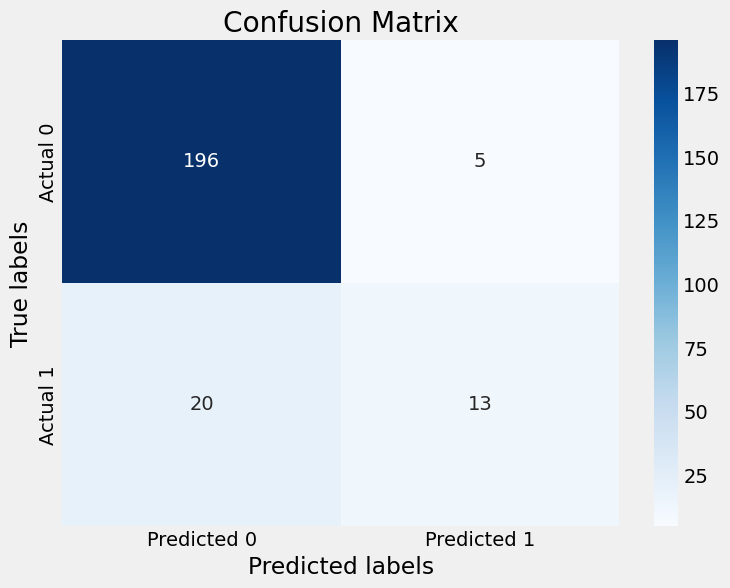

In [ ]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_test_xbg, XGB_prediction)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
from sklearn.metrics import classification_report

report = classification_report(y_test_xbg, XGB_prediction)

print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.98      0.94       201
           1       0.72      0.39      0.51        33

    accuracy                           0.89       234
   macro avg       0.81      0.68      0.72       234
weighted avg       0.88      0.89      0.88       234



In [ ]:
kaggle_cat_cols_encoded_df = pd.get_dummies(kaggle_df, columns = catego_cols, drop_first = True)

kaggle_cat_cols_encoded_df_features = kaggle_cat_cols_encoded_df[['age', 'dailyrate', 'distancefromhome', 'education',
       'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel',
       'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked',
       'percentsalaryhike', 'performancerating', 'relationshipsatisfaction',
       'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear',
       'worklifebalance', 'yearsatcompany', 'yearsincurrentrole',
       'yearssincelastpromotion', 'yearswithcurrmanager',
        'businesstravel_Travel_Frequently',
       'businesstravel_Travel_Rarely', 'department_Research & Development',
       'department_Sales', 'educationfield_Life Sciences',
       'educationfield_Marketing', 'educationfield_Medical',
       'educationfield_Other', 'educationfield_Technical Degree',
       'gender_Male', 'jobrole_Human Resources',
       'jobrole_Laboratory Technician', 'jobrole_Manager',
       'jobrole_Manufacturing Director', 'jobrole_Research Director',
       'jobrole_Research Scientist', 'jobrole_Sales Executive',
       'jobrole_Sales Representative', 'maritalstatus_Married',
       'maritalstatus_Single', 'overtime_Yes']]
# Targer label
# YOUR CODE HERE

kaggle_XGB_prediction = XGB_clf.predict(kaggle_cat_cols_encoded_df_features)

save_prediction('xgboost', kaggle_XGB_prediction)


In [ ]:
#Objective function for XGBoost
def objective_xgb(trial):

    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.5),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'random_state': 42,
        'objective': 'multi:softmax',  # for multiclass classification
        'num_class': len(np.unique(y_train_xbg))  # number of classes
    }

    model = xgb.XGBClassifier(**params)
    return np.mean(cross_val_score(model, x_train_xbg,
                                   y_train_xbg, cv=3, scoring='accuracy'))

In [ ]:
#Objective function for CatBoost
def objective_catboost(trial):

    params = {
        'iterations': trial.suggest_int('iterations', 100, 300),
        'depth': trial.suggest_int('depth', 4, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.5),
        'random_strength': trial.suggest_uniform('random_strength', 0.1, 1.0),
        'thread_count': 4,
        #'cat_features':['businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'overtime'],
       # 'objective': 'multi:softmax',  # for multiclass classification
    }

    model = CatBoostClassifier(**params)
    return np.mean(cross_val_score(model, x_train_xbg,
                                   y_train_xbg, cv=3, scoring='accuracy'))

In [ ]:
#Objective function for LightGBM
def objective_lightgbm(trial):

    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 2, 175),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.5, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.5, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.5),
       # 'objective': 'multi:softmax',  # for multiclass classification
    }

    model = LGBMClassifier(**params)
    return np.mean(cross_val_score(model, x_train_xbg,
                                   y_train_xbg, cv=3, scoring='accuracy'))

In [ ]:
# Perform hyperparameter optimization with Optuna for XGB
optuna.logging.set_verbosity(optuna.logging.WARNING)

study = optuna.create_study(direction='maximize')
study.optimize(objective_xgb, n_trials=100)

# Get the best hyperparameters and the best score
best_params = study.best_params
best_score = study.best_value

print("Best score:", best_score)
print("Best params:", best_params)

Best score: 0.8782051282051282
Best params: {'n_estimators': 75, 'max_depth': 4, 'learning_rate': 0.2176216152065955, 'subsample': 0.5796198773630132, 'colsample_bytree': 0.7499066567139823, 'gamma': 0.8440763947707506, 'min_child_weight': 9}


In [ ]:
# Perform hyperparameter optimization with Optuna for Catboost
optuna.logging.set_verbosity(optuna.logging.WARNING)

study = optuna.create_study(direction='maximize')
study.optimize(objective_catboost, n_trials=100)

# Get the best hyperparameters and the best score
best_params = study.best_params
best_score = study.best_value

print("Best score:", best_score)
print("Best params:", best_params)

Streaming output truncated to the last 5000 lines.
59:	learn: 0.1863493	total: 150ms	remaining: 369ms
60:	learn: 0.1844493	total: 152ms	remaining: 366ms
61:	learn: 0.1822923	total: 154ms	remaining: 364ms
62:	learn: 0.1805796	total: 157ms	remaining: 361ms
63:	learn: 0.1787282	total: 159ms	remaining: 358ms
64:	learn: 0.1770813	total: 161ms	remaining: 355ms
65:	learn: 0.1754934	total: 164ms	remaining: 352ms
66:	learn: 0.1733740	total: 166ms	remaining: 349ms
67:	learn: 0.1718722	total: 168ms	remaining: 346ms
68:	learn: 0.1690140	total: 170ms	remaining: 343ms
69:	learn: 0.1668092	total: 173ms	remaining: 340ms
70:	learn: 0.1648377	total: 175ms	remaining: 337ms
71:	learn: 0.1634069	total: 177ms	remaining: 334ms
72:	learn: 0.1607733	total: 179ms	remaining: 331ms
73:	learn: 0.1591014	total: 181ms	remaining: 328ms
74:	learn: 0.1574596	total: 187ms	remaining: 331ms
75:	learn: 0.1544851	total: 192ms	remaining: 334ms
76:	learn: 0.1531785	total: 195ms	remaining: 333ms
77:	learn: 0.1517467	total: 198

In [ ]:
# Perform hyperparameter optimization with Optuna for LightGBM
optuna.logging.set_verbosity(optuna.logging.WARNING)

study = optuna.create_study(direction='maximize')
study.optimize(objective_lightgbm, n_trials=100)

# Get the best hyperparameters and the best score
best_params = study.best_params
best_score = study.best_value

print("Best score:", best_score)
print("Best params:", best_params)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

## Apply LightGBM (Optional)

LightGBM is an open-source GBDT framework created by Microsoft as a fast and scalable alternative to XGB and GBM. By default LightGBM will train a Gradient Boosted Decision Tree (GBDT), but it also supports random forests, Dropouts meet Multiple Additive Regression Trees (DART), and Gradient Based One-Side Sampling (Goss).

To know more about LightGBM parameters, refer [here](https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html#lightgbm.LGBMClassifier).

### Feature Engineering for LightGBM

In [ ]:
## Following the same procedure as followed in XGBoost

# Copy the dataframe
# YOUR CODE HERE

# Handling categorical features
# YOUR CODE HERE

# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE

# Rename target column
# YOUR CODE HERE

# Features Space
# YOUR CODE HERE

# Target Label
# YOUR CODE HERE

### Model Definition

**Hint:**
* Use LGBMClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Create LightGBM classifier model
# YOUR CODE HERE
#Best score: 0.8782051282051282
#Best params: {'n_estimators': 161, 'lambda_l1': 0.005860115985395062, 'lambda_l2': 6.23269058890458e-07,
#'num_leaves': 155, 'max_depth': 5, 'feature_fraction': 0.5421370548289636, 'bagging_fraction': 0.8115148447033648,
#'bagging_freq': 8, 'min_child_samples': 99, 'learning_rate': 0.08659206744339439}
LGBM_clf = LGBMClassifier(learning_rate=0.08659206744339439, n_estimators=161, lambda_l1=0.005860115985395062,
                          lambda_l2=6.23269058890458e-07, num_leaves=155, max_depth=5,
                          feature_fraction=0.5421370548289636, bagging_fraction=0.8115148447033648,
                          bagging_freq=8, min_child_samples=99)

In [ ]:
# Model training
# YOUR CODE HERE
LGBM_clf.fit(x_train_xbg, y_train_xbg,
            eval_set = [(x_train_xbg, y_train_xbg), (x_test_xbg, y_test_xbg)])

[LightGBM] [Warning] feature_fraction is set=0.5421370548289636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421370548289636
[LightGBM] [Warning] lambda_l2 is set=6.23269058890458e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23269058890458e-07
[LightGBM] [Warning] lambda_l1 is set=0.005860115985395062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005860115985395062
[LightGBM] [Warning] bagging_fraction is set=0.8115148447033648, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8115148447033648
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] feature_fraction is set=0.5421370548289636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421370548289636
[LightGBM] [Warning] lambda_l2 is set=6.23269058890458e-07, reg_lambda=0.0 will be

LGBMClassifier(bagging_fraction=0.8115148447033648, bagging_freq=8,
               feature_fraction=0.5421370548289636,
               lambda_l1=0.005860115985395062, lambda_l2=6.23269058890458e-07,
               learning_rate=0.08659206744339439, max_depth=5,
               min_child_samples=99, n_estimators=161, num_leaves=155)

### Model performance

In [ ]:
# Model performance on all sets
# YOUR CODE HERE
LGBM_prediction = LGBM_clf.predict(x_test_xbg)
acc_scr_lightgbm = accuracy_score(y_test_xbg, LGBM_prediction)
print('Accuracy Score: ', acc_scr_lightgbm)


[LightGBM] [Warning] feature_fraction is set=0.5421370548289636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421370548289636
[LightGBM] [Warning] lambda_l2 is set=6.23269058890458e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23269058890458e-07
[LightGBM] [Warning] lambda_l1 is set=0.005860115985395062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005860115985395062
[LightGBM] [Warning] bagging_fraction is set=0.8115148447033648, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8115148447033648
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
Accuracy Score:  0.8888888888888888


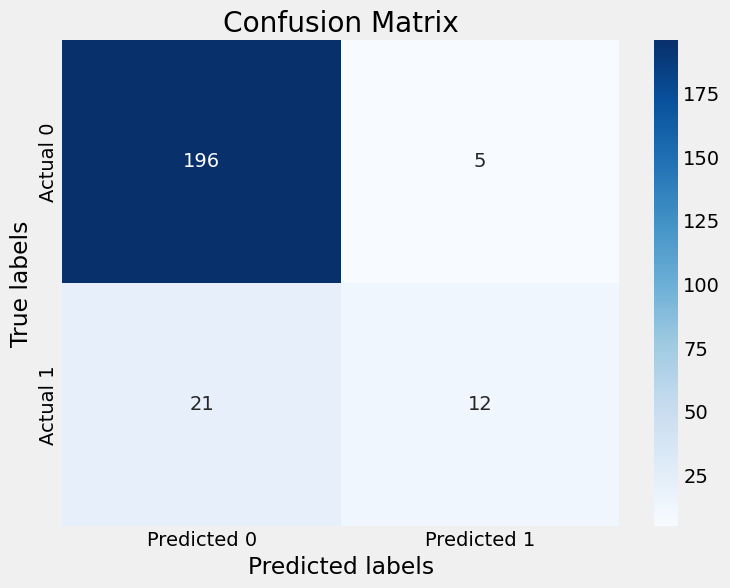

In [ ]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_test_xbg, LGBM_prediction)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
kaggle_LGBM_prediction = LGBM_clf.predict(kaggle_cat_cols_encoded_df_features)

save_prediction('lightgbm', kaggle_LGBM_prediction)

[LightGBM] [Warning] feature_fraction is set=0.5421370548289636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421370548289636
[LightGBM] [Warning] lambda_l2 is set=6.23269058890458e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23269058890458e-07
[LightGBM] [Warning] lambda_l1 is set=0.005860115985395062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005860115985395062
[LightGBM] [Warning] bagging_fraction is set=0.8115148447033648, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8115148447033648
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


In [ ]:
#Voting Classifier for CatBoost, XGB and LightGBM
from sklearn.ensemble import VotingClassifier

best_voting_clf = VotingClassifier(estimators=[
    ('catb', CatBoost_clf_wo_catfeat),
    ('xgb', XGB_clf),
    ('lightgbm', LGBM_clf)
], voting='soft')

#best_voting_clf.fit(emp_attr_cat_cols_encoded_df_features, emp_attr_cat_cols_encoded_df_target)
best_voting_clf.fit(x_train_xbg, y_train_xbg)

y_pred_vot = best_voting_clf.predict(x_test_xbg)

accuracy_vot = accuracy_score(y_test_xbg, y_pred_vot)
print("Final Voting Classifier accuracy:", accuracy_vot)

kaggle_vot_prediction = best_voting_clf.predict(kaggle_cat_cols_encoded_df_features)

save_prediction('votingsoft', kaggle_vot_prediction)

0:	learn: 0.6243632	total: 1.94ms	remaining: 375ms
1:	learn: 0.5604034	total: 4.39ms	remaining: 422ms
2:	learn: 0.5205018	total: 6.5ms	remaining: 414ms
3:	learn: 0.4754703	total: 8.27ms	remaining: 393ms
4:	learn: 0.4523230	total: 10.3ms	remaining: 388ms
5:	learn: 0.4283354	total: 12.2ms	remaining: 383ms
6:	learn: 0.4061967	total: 14.1ms	remaining: 377ms
7:	learn: 0.3922393	total: 16.1ms	remaining: 375ms
8:	learn: 0.3791445	total: 18.1ms	remaining: 373ms
9:	learn: 0.3682987	total: 20.1ms	remaining: 370ms
10:	learn: 0.3564943	total: 22.1ms	remaining: 368ms
11:	learn: 0.3446054	total: 24.6ms	remaining: 373ms
12:	learn: 0.3374938	total: 26.5ms	remaining: 370ms
13:	learn: 0.3296965	total: 28.5ms	remaining: 366ms
14:	learn: 0.3250415	total: 30.4ms	remaining: 363ms
15:	learn: 0.3198373	total: 32.2ms	remaining: 358ms
16:	learn: 0.3129353	total: 34.1ms	remaining: 355ms
17:	learn: 0.3066072	total: 36ms	remaining: 352ms
18:	learn: 0.3003612	total: 38ms	remaining: 350ms
19:	learn: 0.2949952	total:

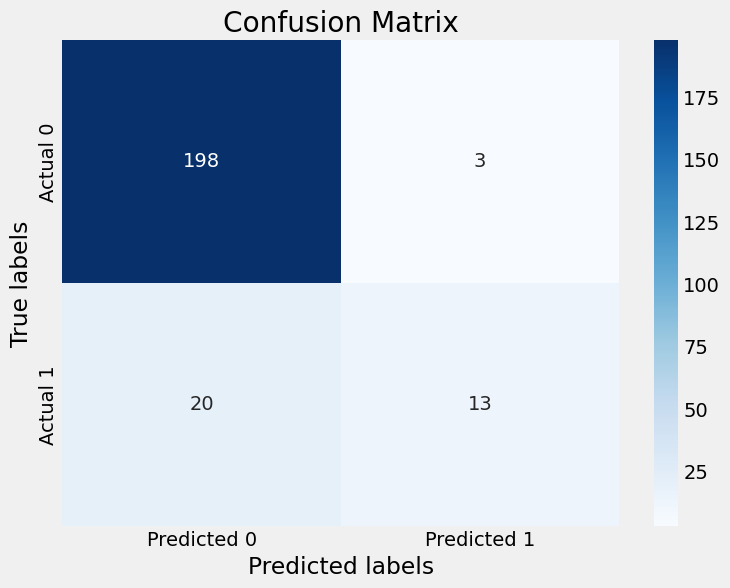

In [ ]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_test_xbg, y_pred_vot)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

## Results

**Exercise 12: Create a dataframe of XGBoost results and CatBoost results and display them [0.5 Mark]**

**Hint:** Use pd.DataFrame

In [ ]:
# Create a dataframe for computed metrics for different models
# YOUR CODE HERE
cat_xgb = pd.DataFrame()

metrics_df = pd.DataFrame({
    'Model': ['CatBoost', 'CatBoost_wo_cat_features', 'XGBoost', 'LightGBM', 'Voting'],
    'Accuracy': [acc_scr_catboost, acc_scr_catboost_2, acc_scr_xgb, acc_scr_lightgbm, accuracy_vot],
})
print(metrics_df)

                      Model  Accuracy
0                  CatBoost  0.897436
1  CatBoost_wo_cat_features  0.897436
2                   XGBoost  0.893162
3                  LightGBM  0.888889
4                    Voting  0.901709


Reference reading:
1. https://machinelearningmastery.com/xgboost-for-imbalanced-classification/